In [2]:
%%capture 
%run "./utils.ipynb"
# %run "./EDA: Experience Analysis.ipynb"
%store -r focused_df

In [3]:
focused_df.head()

,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Handset Type,0,1,2
0,42.0,5.0,23.0,44.0,573621.0,21035.0,Samsung Galaxy A5 Sm-A520F,47.0,67.0,594656.0
1,65.0,5.0,16.0,26.0,573621.0,21035.0,Samsung Galaxy J5 (Sm-J530),70.0,42.0,594656.0
6,102.0,5.0,22.0,38.0,573621.0,21035.0,Huawei Mate 20 Lite,107.0,60.0,594656.0
7,39.0,18.0,3698.0,416.0,19520.0,21035.0,undefined,57.0,4114.0,40555.0
9,97.0,7.0,3845.0,2535.0,3231397.0,7230.0,Samsung Galaxy Note 8 (Sm-N950F Ds),104.0,6380.0,3238627.0


In [4]:
experience_metrics = [0,1,2]

In [5]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# Normalize the numeric features so they're on the same scale
scaled_features = MinMaxScaler().fit_transform(focused_df[experience_metrics])

# Get two principal components
pca = PCA(n_components=2).fit(scaled_features)
features_2d = pca.transform(scaled_features)
features_2d[0:10]

array([[-0.04824837,  0.00053222],
       [-0.0483139 ,  0.00053667],
       [-0.04826731,  0.00053448],
       [-0.0376893 , -0.00024473],
       [-0.03172794,  0.0001271 ],
       [ 0.04253   , -0.00379249],
       [-0.02528381,  0.0065457 ],
       [-0.04593075,  0.00344658],
       [-0.04809401,  0.00052223],
       [-0.04831358,  0.00053612]])

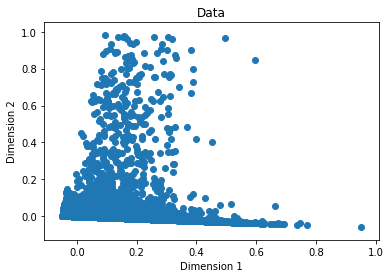

In [6]:
import matplotlib.pyplot as plt

%matplotlib inline

plt.scatter(features_2d[:,0],features_2d[:,1])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Data')
plt.show()

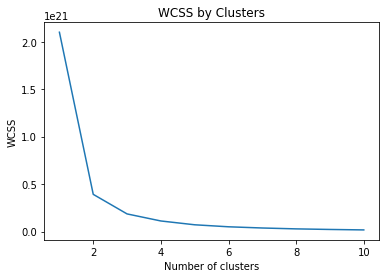

In [7]:
#importing the libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline

# Create 10 models with 1 to 10 clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i)
    # Fit the data points
    kmeans.fit(focused_df[experience_metrics])
    # Get the WCSS (inertia) value
    wcss.append(kmeans.inertia_)
    
#Plot the WCSS values onto a line graph
plt.plot(range(1, 11), wcss)
plt.title('WCSS by Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [8]:
from sklearn.cluster import KMeans

# Create a model based on 3 centroids
model = KMeans(n_clusters=3, init='k-means++', n_init=100, max_iter=1000)
# Fit to the data and predict the cluster assignments for each data point
km_clusters = model.fit_predict(focused_df[experience_metrics].values)
# View the cluster assignments
km_clusters

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [9]:
km_clusters.shape

(121726,)

In [19]:
import numpy as np 
me = np.array(km_clusters)
np.unique(me, return_counts=True)

(array([0, 1, 2], dtype=int32), array([121310,    165,    251]))

In [23]:
experience_point = model.cluster_centers_[1]
experience_point

array([1.47957576e+02, 7.23192909e+04, 3.10186915e+09])

In [ ]:
def plot_clusters(samples, clusters):
    col_dic = {0:'blue',1:'green',2:'orange'}
    mrk_dic = {0:'*',1:'x',2:'+'}
    colors = [col_dic[x] for x in clusters]
    markers = [mrk_dic[x] for x in clusters]
    for sample in range(len(clusters)):
        plt.scatter(samples[sample][0], samples[sample][1], color = colors[sample], marker=markers[sample], s=100)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title('Assignments')
    plt.show()

plot_clusters(features_2d, km_clusters)